### Scheduler features

https://huggingface.co/docs/diffusers/en/using-diffusers/scheduler_features

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


[999, 845, 730, 587, 443, 310, 193, 116, 53, 13]


100%|██████████| 10/10 [00:01<00:00,  6.66it/s]


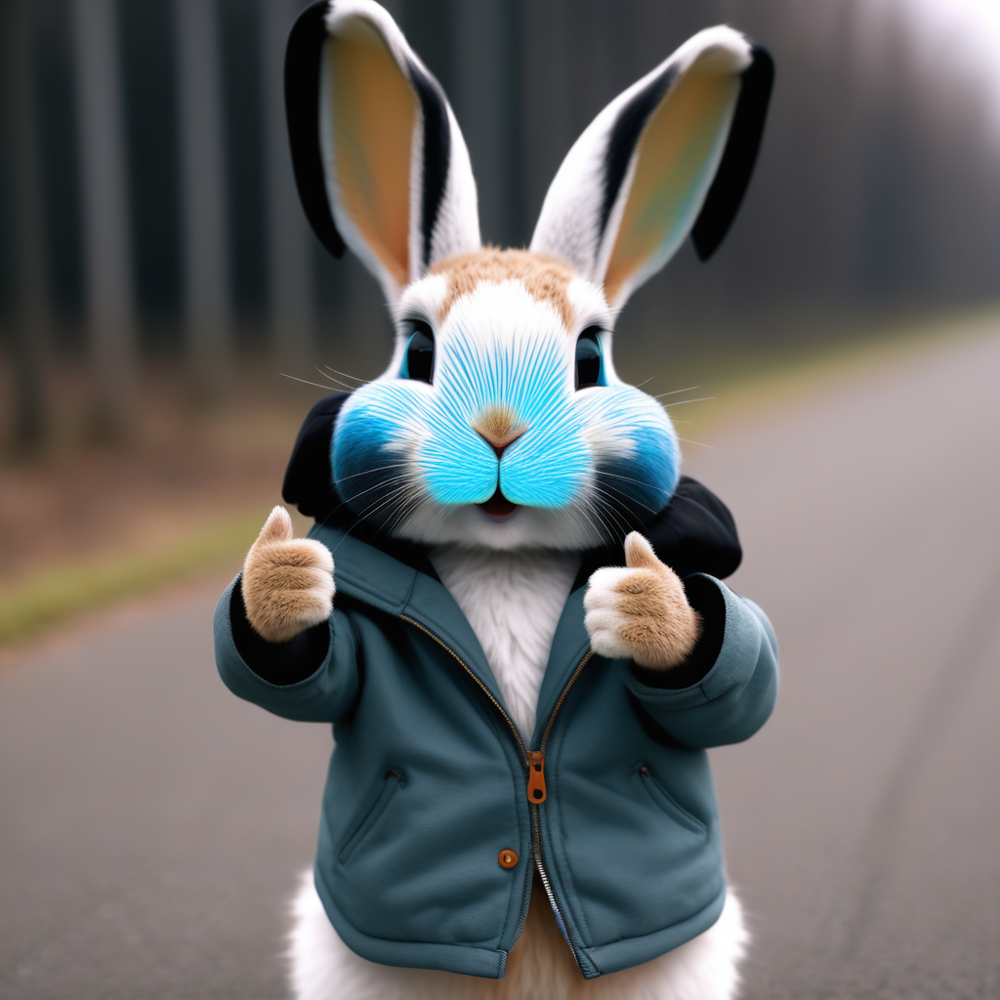

In [ ]:
from diffusers import StableDiffusionXLPipeline, DPMSolverMultistepScheduler
import torch
from diffusers.schedulers import AysSchedules

sampling_schedule = AysSchedules["StableDiffusionXLTimesteps"]
print(sampling_schedule)

pipeline = StableDiffusionXLPipeline.from_pretrained(
    "SG161222/RealVisXL_V4.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
pipeline.scheduler = DPMSolverMultistepScheduler.from_config(
    pipeline.scheduler.config, algorithm_type="sde-dpmsolver++"
)

prompt = (
    "A cinematic shot of a cute little rabbit wearing a jacket and doing a thumbs up"
)
generator = torch.Generator(device="cpu").manual_seed(2487854446)
image = pipeline(
    prompt=prompt,
    negative_prompt="",
    generator=generator,
    timesteps=sampling_schedule,
).images[0]
image

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 5/5 [00:00<00:00,  6.30it/s]


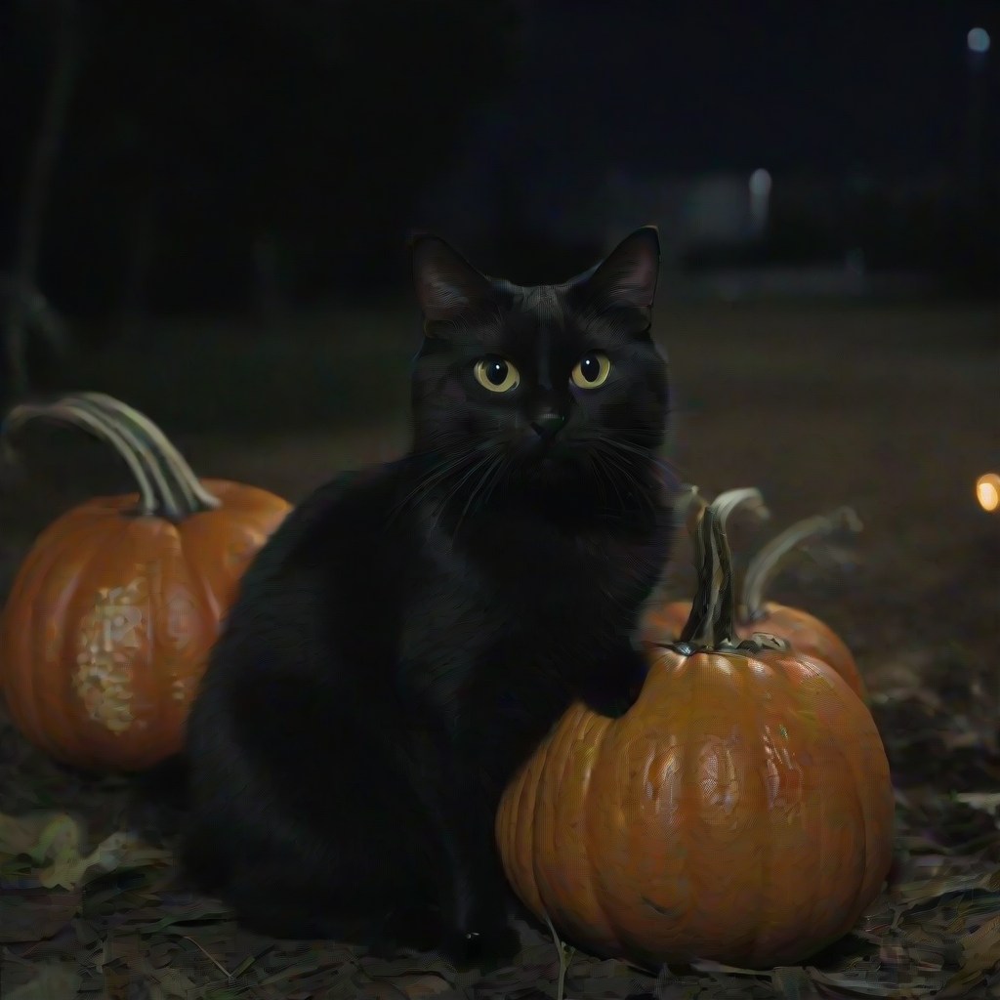

In [1]:
import torch
from diffusers import StableDiffusionXLPipeline, DPMSolverMultistepScheduler

pipeline = StableDiffusionXLPipeline.from_pretrained(
    "SG161222/RealVisXL_V4.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
pipeline.scheduler = DPMSolverMultistepScheduler.from_config(
    pipeline.scheduler.config, timestep_spacing="trailing"
)

prompt = "A cinematic shot of a cute little black cat sitting on a pumpkin at night"
generator = torch.Generator(device="cpu").manual_seed(2487854446)
image = pipeline(
    prompt=prompt,
    negative_prompt="",
    generator=generator,
    num_inference_steps=5,
).images[0]
image

100%|██████████| 10/10 [00:01<00:00,  8.54it/s]


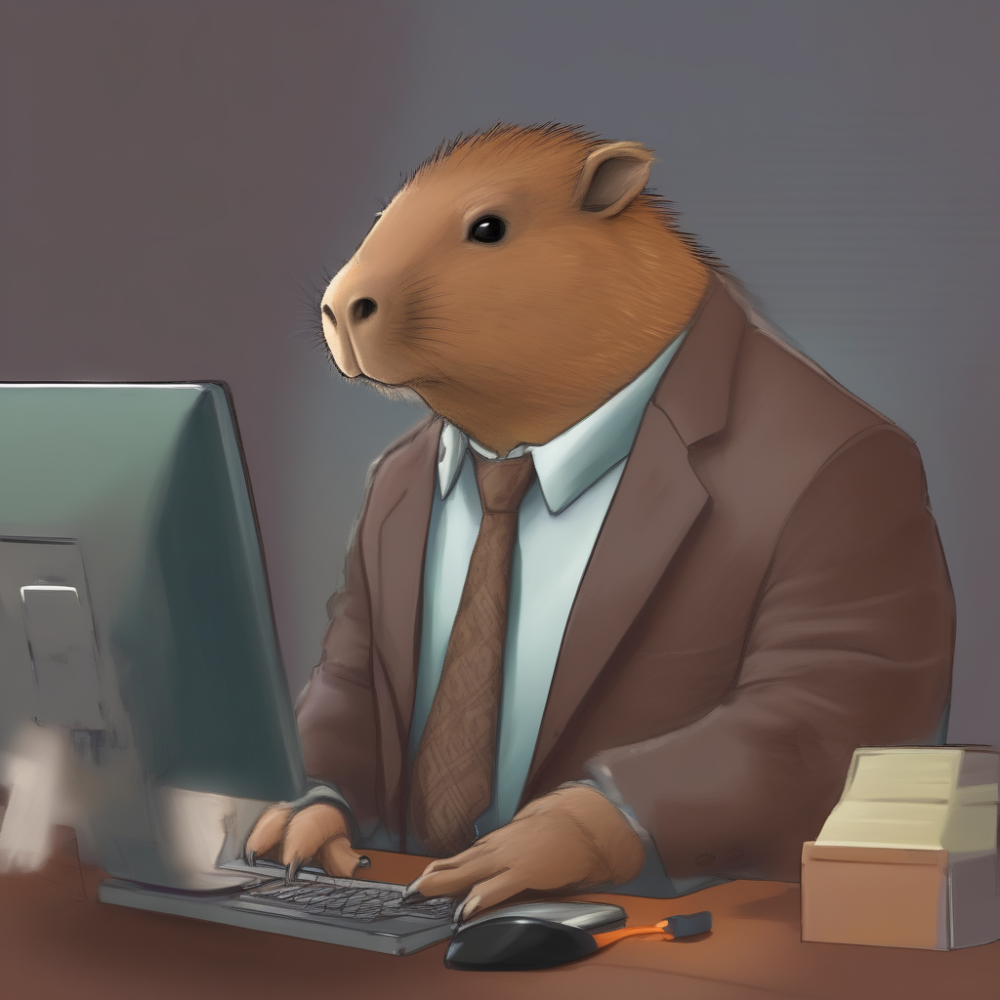

In [ ]:
import torch

from diffusers import DiffusionPipeline, EulerDiscreteScheduler

# https://github.com/huggingface/diffusers/blob/6529ee67ec02fcf58d2fd9242164ea002b351d75/src/diffusers/schedulers/scheduling_utils.py#L55
model_id = "stabilityai/stable-diffusion-xl-base-1.0"
pipeline = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
pipeline.scheduler = EulerDiscreteScheduler.from_config(pipeline.scheduler.config)

sigmas = [14.615, 6.315, 3.771, 2.181, 1.342, 0.862, 0.555, 0.380, 0.234, 0.113, 0.0]
prompt = "anthropomorphic capybara wearing a suit and working with a computer"
generator = torch.Generator(device="cuda").manual_seed(123)
image = pipeline(
    prompt=prompt, num_inference_steps=10, sigmas=sigmas, generator=generator
).images[0]
image

### Pipeline callbacks

https://huggingface.co/docs/diffusers/en/using-diffusers/callback

100%|██████████| 25/25 [00:02<00:00, 10.92it/s]


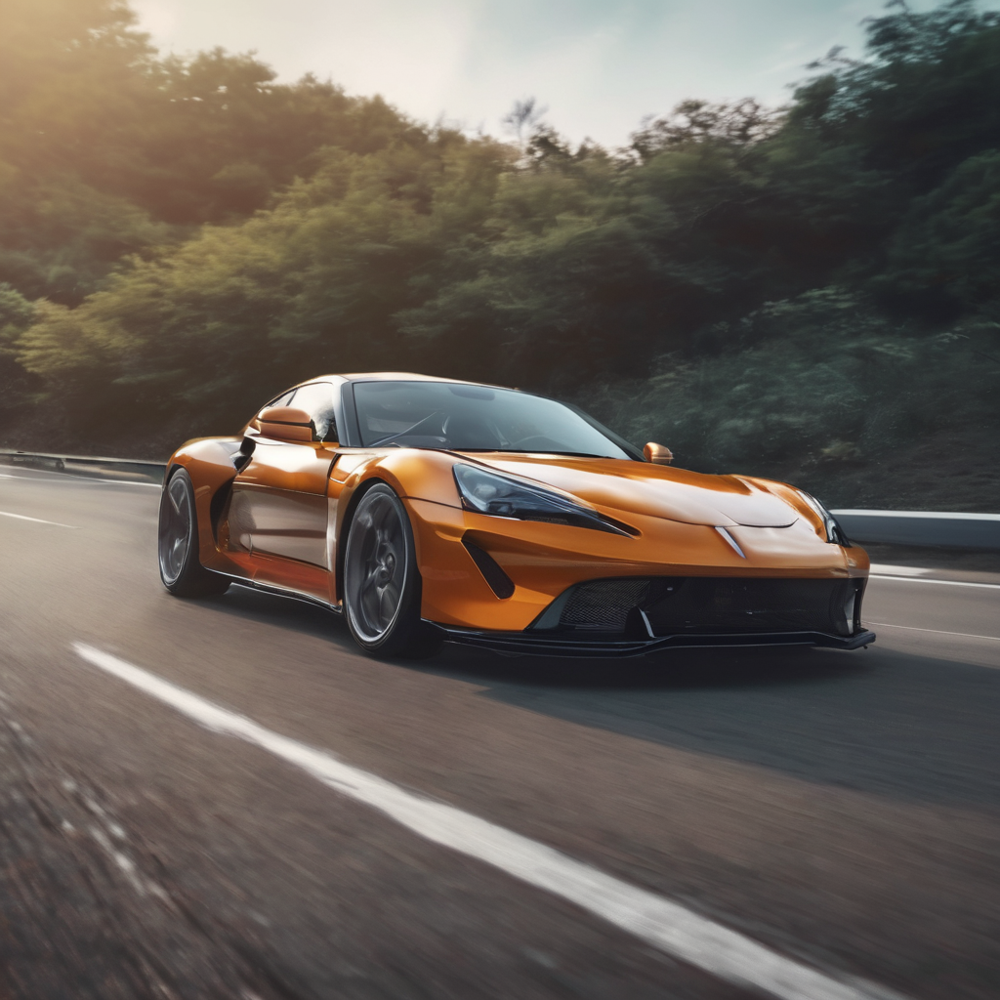

In [ ]:
import torch

from diffusers import DPMSolverMultistepScheduler, StableDiffusionXLPipeline
from diffusers.callbacks import SDXLCFGCutoffCallback


# SDCFGCutoffCallback: Disables the CFG after a certain number of steps for
# all SD 1.5 pipelines, including text-to-image, image-to-image, inpaint, and controlnet.

# SDXLCFGCutoffCallback: Disables the CFG after a certain number of steps for all SDXL
# pipelines, including text-to-image, image-to-image, inpaint, and controlnet.

# IPAdapterScaleCutoffCallback: Disables the IP Adapter after a certain number of
# steps for all pipelines supporting IP-Adapter.

callback = SDXLCFGCutoffCallback(cutoff_step_ratio=0.4)
# can also be used with cutoff_step_index
# callback = SDXLCFGCutoffCallback(cutoff_step_ratio=None, cutoff_step_index=10)

pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
).to("cuda")
pipeline.scheduler = DPMSolverMultistepScheduler.from_config(
    pipeline.scheduler.config, use_karras_sigmas=True
)

prompt = (
    "a sports car at the road, best quality, high quality, high detail, 8k resolution"
)

generator = torch.Generator(device="cpu").manual_seed(2628670641)

out = pipeline(
    prompt=prompt,
    negative_prompt="",
    guidance_scale=6.5,
    num_inference_steps=25,
    generator=generator,
    callback_on_step_end=callback,
)

out.images[0]
###

### Controlling image quality

https://huggingface.co/docs/diffusers/en/using-diffusers/image_quality

/opt/conda/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...: 100%|██████████| 6/6 [00:00<00:00, 15.51it/s]
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
  0%|          | 0/50 [00

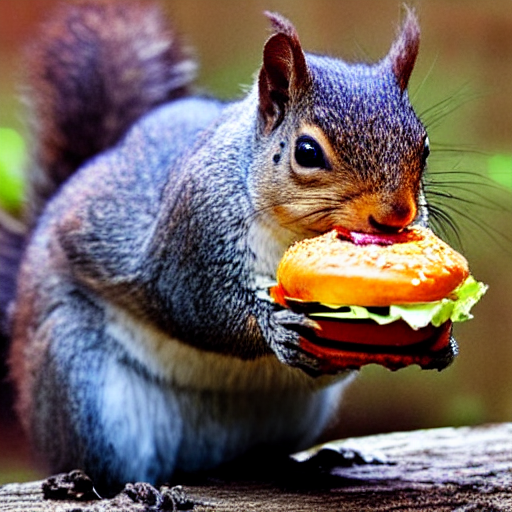

In [ ]:
import torch
from diffusers import DiffusionPipeline

pipeline = DiffusionPipeline.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
    safety_checker=None,
).to("cuda")
# https://github.com/huggingface/diffusers/blob/df55f0535829e2a1348062f85c7483fb51197102/src/diffusers/models/unets/unet_2d_blocks.py#L2537
# https://github.com/huggingface/diffusers/blob/df55f0535829e2a1348062f85c7483fb51197102/src/diffusers/utils/torch_utils.py#L129
pipeline.enable_freeu(s1=0.9, s2=0.2, b1=1.5, b2=1.6)
# SDXL
# b1: 1.3, b2: 1.4, s1: 0.9, s2: 0.2
generator = torch.Generator(device="cpu").manual_seed(33)
prompt = "A squirrel eating a burger"
image = pipeline(prompt, generator=generator).images[0]
image

100%|██████████| 50/50 [00:01<00:00, 39.96it/s]


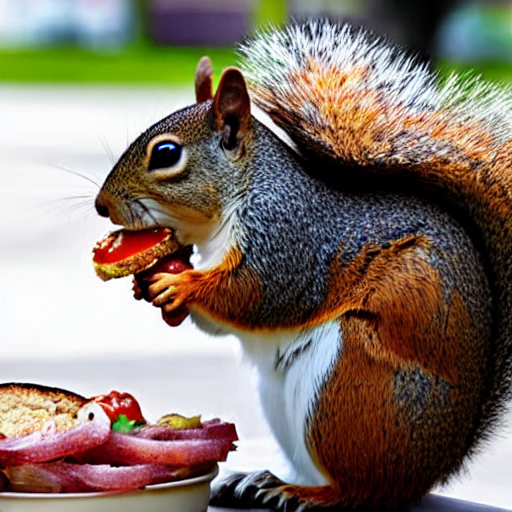

In [3]:
pipeline.disable_freeu()
image = pipeline(prompt, generator=generator).images[0]
image

#### Textual inversion

https://huggingface.co/docs/diffusers/en/using-diffusers/weighted_prompts#textual-inversion

In [4]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16,
).to("cuda")
pipe.load_textual_inversion("sd-concepts-library/midjourney-style")

Loading pipeline components...: 100%|██████████| 7/7 [00:00<00:00,  8.67it/s]
The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


In [6]:
!pip install git+https://github.com/xhinker/sd_embed.git@main

Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/xhinker/sd_embed.git (to revision main) to /tmp/pip-req-build-s7qzb5il
  Running command git clone --filter=blob:none --quiet https://github.com/xhinker/sd_embed.git /tmp/pip-req-build-s7qzb5il
  Resolved https://github.com/xhinker/sd_embed.git to commit 4a47f71150a22942fa606fb741a1c971d95ba56f
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 13.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 25.3 MB/s eta 0:00:00
  Created wheel for sd_embed: filename=sd_embed-1.240829.1-py3-none-any.whl size=19918 sha256=5a80bf2b7376c5949565453ccc027bb418d2f7177b37c5a9955132e08c066ddb
  Stored in directory: /tmp/pip-ephem-wheel-cache-r9koputn/wheels/51/99/4e/b8a6c14adfb5191b0c55362b197f41c5b836299181fda06341
Successfully built sd_embed


In [7]:
from sd_embed.embedding_funcs import get_weighted_text_embeddings_sd15

prompt = """<midjourney-style> A whimsical and creative image depicting a hybrid creature that is a mix of a waffle and a hippopotamus. 
This imaginative creature features the distinctive, bulky body of a hippo, 
but with a texture and appearance resembling a golden-brown, crispy waffle. 
The creature might have elements like waffle squares across its skin and a syrup-like sheen. 
It's set in a surreal environment that playfully combines a natural water habitat of a hippo with elements of a breakfast table setting, 
possibly including oversized utensils or plates in the background. 
The image should evoke a sense of playful absurdity and culinary fantasy.
"""

neg_prompt = """\
skin spots,acnes,skin blemishes,age spot,(ugly:1.2),(duplicate:1.2),(morbid:1.21),(mutilated:1.2),\
(tranny:1.2),mutated hands,(poorly drawn hands:1.5),blurry,(bad anatomy:1.2),(bad proportions:1.3),\
extra limbs,(disfigured:1.2),(missing arms:1.2),(extra legs:1.2),(fused fingers:1.5),\
(too many fingers:1.5),(unclear eyes:1.2),lowers,bad hands,missing fingers,extra digit,\
bad hands,missing fingers,(extra arms and legs),(worst quality:2),(low quality:2),\
(normal quality:2),lowres,((monochrome)),((grayscale))
"""

Token indices sequence length is longer than the specified maximum sequence length for this model (125 > 77). Running this sequence through the model will result in indexing errors
100%|██████████| 50/50 [00:03<00:00, 15.84it/s]


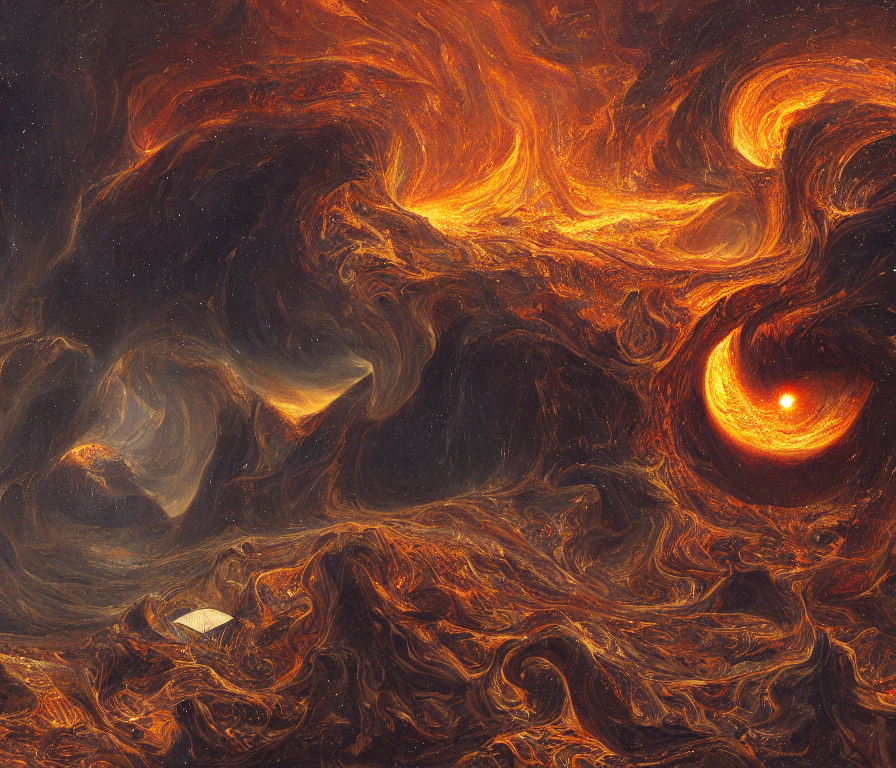

In [8]:
(
    prompt_embeds,
    prompt_neg_embeds,
) = get_weighted_text_embeddings_sd15(pipe, prompt=prompt, neg_prompt=neg_prompt)

image = pipe(
    prompt_embeds=prompt_embeds,
    negative_prompt_embeds=prompt_neg_embeds,
    height=768,
    width=896,
    guidance_scale=4.0,
    generator=torch.Generator("cuda").manual_seed(2),
).images[0]
image

#### DreamBooth

https://huggingface.co/docs/diffusers/en/using-diffusers/weighted_prompts#dreambooth

In [ ]:
import torch
from diffusers import DiffusionPipeline, UniPCMultistepScheduler

pipe = DiffusionPipeline.from_pretrained(
    "sd-dreambooth-library/dndcoverart-v1", torch_dtype=torch.float16
).to("cuda")
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

  0%|          | 0/50 [00:00<?, ?it/s]

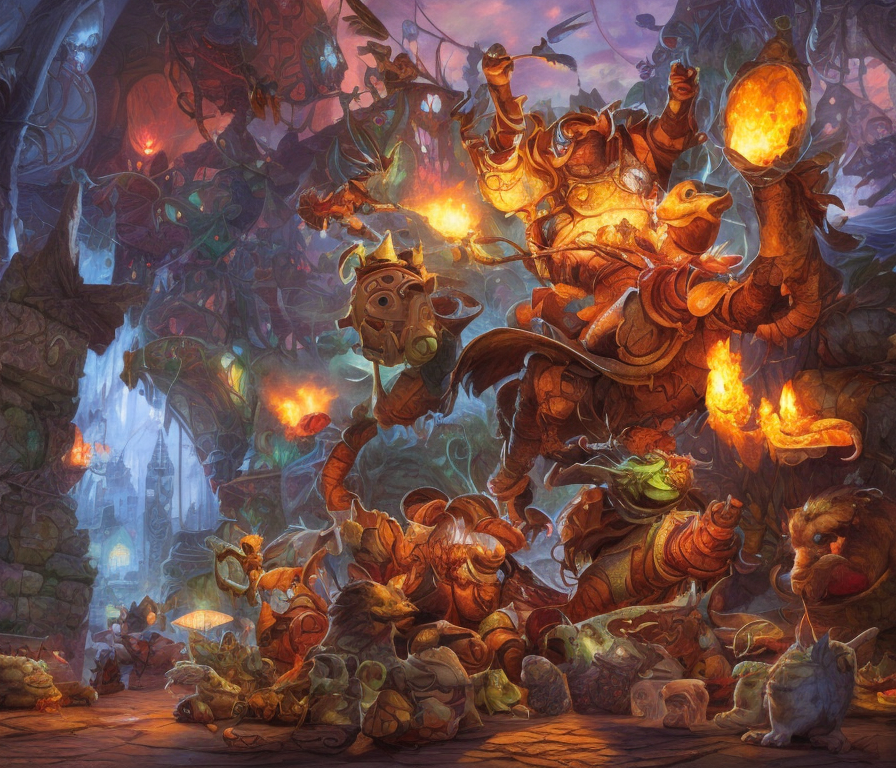

In [3]:
from sd_embed.embedding_funcs import get_weighted_text_embeddings_sd15

prompt = """dndcoverart of A whimsical and creative image depicting a hybrid creature that is a mix of a waffle and a hippopotamus. 
This imaginative creature features the distinctive, bulky body of a hippo, 
but with a texture and appearance resembling a golden-brown, crispy waffle. 
The creature might have elements like waffle squares across its skin and a syrup-like sheen. 
It's set in a surreal environment that playfully combines a natural water habitat of a hippo with elements of a breakfast table setting, 
possibly including oversized utensils or plates in the background. 
The image should evoke a sense of playful absurdity and culinary fantasy.
"""

neg_prompt = """\
skin spots,acnes,skin blemishes,age spot,(ugly:1.2),(duplicate:1.2),(morbid:1.21),(mutilated:1.2),\
(tranny:1.2),mutated hands,(poorly drawn hands:1.5),blurry,(bad anatomy:1.2),(bad proportions:1.3),\
extra limbs,(disfigured:1.2),(missing arms:1.2),(extra legs:1.2),(fused fingers:1.5),\
(too many fingers:1.5),(unclear eyes:1.2),lowers,bad hands,missing fingers,extra digit,\
bad hands,missing fingers,(extra arms and legs),(worst quality:2),(low quality:2),\
(normal quality:2),lowres,((monochrome)),((grayscale))
"""

(prompt_embeds, prompt_neg_embeds) = get_weighted_text_embeddings_sd15(
    pipe, prompt=prompt, neg_prompt=neg_prompt
)
image = pipe(
    prompt_embeds=prompt_embeds,
    negative_prompt_embeds=prompt_neg_embeds,
    height=768,
    width=896,
    guidance_scale=4.0,
    generator=torch.Generator("cuda").manual_seed(2),
).images[0]
image